# **Impact of COVID-19 vaccination on mortality and recovery rate**

# Background and Rationale

Corona Virus (COVID-19) is a respiratory disease which impacts the overall health of individuals. The most common symptomps for the virus include but are not limited to: fever, cough, sore throat and difficulty breathing. The first case of COVID-19 was reported in China in December 2019 and in March 2020, COVID-19 was decleared a pandemic disease by WHO, which meant that the virus was spreading quickly globally. Social interactions and relations are essential to man's existance and our community and societies are founded on the ability to interact and associate with others. With the spread of the novel coronavirus, the world was faced with the need to implement containment measures to slow the spread of the virus. Physicial distancing, isolation measures, lockdowns and  restrictions were rapidly implemented globally. The containment measures severely impacted several aspects of daily lives.  The ability for humans to have interpersonal and community interactions was severly affected leading to a rise in loneliness, anxiety, depression and mental disorders (Singh, 2020).

The economic sector has also been depply affected.
Early estimates project that COVID-19 could cost the global economy more than USD 2.7 trillion, with ramifications ranging from gross domestic product to local employment. Due to globalization  numereous companies build supply chains across borders leading to an intertwining of the national economies and implying that economic losses experienced by individual countries would have global ramifications. International exporters slowed down supply immensely, and many small business were forced to permanently close their doors after long lockdowns which made it hard for small business owners to cover the cost of rent and equipment (Rae, 2020).

In an ttempt to restore society to its glorious norms, the pandemic sped up the vaccine development efforts worldwide, as researchers and governments alike raced to put an end to this plague. The absence of any effective clinical or pharmaceutical intervention that could cut short the illness, made the development of a vacccine the only option. 

Now, after an incredibly and unprecedented fast-paced research, several vaccines have been developed with efficacy between 90% and 98%. The new focus of research is now on the expected impact of universal vaccination on the parameters of infection although this is hard to predict since this depends on a mix of logistical, epidemiological and cost factors.

In an early study in the US, researched developed a mathemitcal model to try and predict the impact of vaccination.
The researchers found that the effect of vaccination was to reduce the overall infection rate from around 7% to 1.6%. In the vaccinated population, the rate of hospitalizations-cum-admission to the intensive care unit (ICU), and deaths, were markedly reduced by around 85% and 88%, respectively. Even if only 20% of the population was vaccinated, the reduction in hospitalization and deaths was predicted to be around 60% and 64%, respectively (Thomas, 2020).

With 11,158,636 doses of vaccine administered in Canada to date, and 26.79% of Canadian having received at least one vaccine doses, effects of increased vaccination rates could already be detectible in COVID-19 mortality rate and COVID-19 recovery rate.


# Objective

The objective of this project is to check if the effects of increased vaccination rates in the Canadian populations, has an effect on COVID-19 mortality rate and recovery rates.
The questions we want to answer are:
* Is there a relationship between COVID-19 vaccination rates and 
mortality rates in Canada?
*Is there a relationship between COVID-19 vaccination rates and recovery rates in Canada?

**Dataset**

The COVID-19 data was obtained from the COVID-19 Canada timeseries data available on the github openesource data.
The following data files are used for this project:
*   recovered_timeseries_canada.csv
> dataset provides daily data on recorded COVID-19 cases and cumulative recovered cases
*  vaccine_completion_timeseries_canada.csv
> dataset provides daily data on number of Canadians who are completely immunized daily and cumulative  number of immunized Canadians daily.
* mortality_timeseries_canada.csv
> dataset provides daily data on recorded COVID-19 deaths and cumulative deaths
* cases_timeseries_canada.csv
> dataset provides daily data on COVID-19 cases and cumulative  cases

**Supplemental Data**

*   For per Capita death rates and cases rates calculations, Canadian 
population data is also used  from Stat Canada and can be found: https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1710000901.
The data can be downloaded as CSV and uploaded.

* For visualization of COVID data by province, publicly available COVID-19 dataset from the Center for Systems Science and Engineering (CSSE) at Johns Hopkins University which you can be found in a GitHub repository was used. The following data files are used for this project:

> *   time_series_covid19_confirmed_global.csv
> *  time_series_covid19_deaths_global.csv





# Data wrangling for Visualization

A series of data maniupulation is necessary to be able to visualize the data, and get a better understanding of current COVID-19 state in Canada.


In [1]:
!pip install -U plotly

Requirement already up-to-date: plotly in /usr/local/lib/python3.7/dist-packages (4.14.3)


In [2]:
#Import necessary libraries
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.graph_objects as go
import datetime

In [3]:
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
covidcase = pd.read_csv(url, index_col=0)
print(covidcase.head(5))

               Country/Region       Lat       Long  ...  4/19/21  4/20/21  4/21/21
Province/State                                      ...                           
NaN               Afghanistan  33.93911  67.709953  ...    57898    58037    58214
NaN                   Albania  41.15330  20.168300  ...   129694   129842   129980
NaN                   Algeria  28.03390   1.659600  ...   119805   119992   120174
NaN                   Andorra  42.50630   1.521800  ...    12805    12874    12917
NaN                    Angola -11.20270  17.873900  ...    24518    24661    24883

[5 rows x 459 columns]


In [4]:
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
coviddeath= pd.read_csv(url, index_col=0)
print(coviddeath.head(5))

               Country/Region       Lat       Long  ...  4/19/21  4/20/21  4/21/21
Province/State                                      ...                           
NaN               Afghanistan  33.93911  67.709953  ...     2546     2549     2557
NaN                   Albania  41.15330  20.168300  ...     2347     2353     2358
NaN                   Algeria  28.03390   1.659600  ...     3160     3165     3172
NaN                   Andorra  42.50630   1.521800  ...      123      123      123
NaN                    Angola -11.20270  17.873900  ...      563      565      570

[5 rows x 459 columns]


In [5]:
covidcase = covidcase[covidcase['Country/Region'].str.contains('Canada')]
covidcase = covidcase.drop([covidcase.index[2] , covidcase.index[3], covidcase.index[7], covidcase.index[13],covidcase.index[9], covidcase.index[15] ])
covidcase=covidcase.drop(['Country/Region', 'Lat', 'Long'], axis=1)
covidcase2=covidcase
covidcase2.reset_index(level=0, inplace=True)
covidcase2=covidcase2.melt(id_vars=["Province/State"], var_name="Date", 
value_name="Cases")
covidcase2['Date']= pd.to_datetime(covidcase2['Date'])
covidcase2

,Province/State,Date,Cases
0,Alberta,2020-01-22,0
1,British Columbia,2020-01-22,0
2,Manitoba,2020-01-22,0
3,New Brunswick,2020-01-22,0
4,Newfoundland and Labrador,2020-01-22,0
...,...,...,...
4555,Nova Scotia,2021-04-21,1856
4556,Ontario,2021-04-21,436693
4557,Prince Edward Island,2021-04-21,174
4558,Quebec,2021-04-21,340397


In [6]:
coviddeath = coviddeath[coviddeath['Country/Region'].str.contains('Canada')]
coviddeath = coviddeath.drop([coviddeath.index[2] , coviddeath.index[3], coviddeath.index[7], coviddeath.index[9], coviddeath.index[13], coviddeath.index[15]])
coviddeath=coviddeath.drop(['Country/Region', 'Lat', 'Long'], axis=1)
coviddeath2=coviddeath
coviddeath2.reset_index(level=0, inplace=True)
coviddeath2=coviddeath2.melt(id_vars=["Province/State"], var_name="Date",  value_name="Deaths")
coviddeath2['Date']= pd.to_datetime(coviddeath2['Date'])
coviddeath2

,Province/State,Date,Deaths
0,Alberta,2020-01-22,0
1,British Columbia,2020-01-22,0
2,Manitoba,2020-01-22,0
3,New Brunswick,2020-01-22,0
4,Newfoundland and Labrador,2020-01-22,0
...,...,...,...
4555,Nova Scotia,2021-04-21,67
4556,Ontario,2021-04-21,7786
4557,Prince Edward Island,2021-04-21,0
4558,Quebec,2021-04-21,10838


In [7]:
new_df = pd.merge(coviddeath2, covidcase2, how="outer", on=["Province/State", "Date"])
new_df['year'] = pd.DatetimeIndex(new_df['Date']).year
new_df['Month'] = pd.DatetimeIndex(new_df['Date']).month
new_df

,Province/State,Date,Deaths,Cases,year,Month
0,Alberta,2020-01-22,0,0,2020,1
1,British Columbia,2020-01-22,0,0,2020,1
2,Manitoba,2020-01-22,0,0,2020,1
3,New Brunswick,2020-01-22,0,0,2020,1
4,Newfoundland and Labrador,2020-01-22,0,0,2020,1
...,...,...,...,...,...,...
4555,Nova Scotia,2021-04-21,67,1856,2021,4
4556,Ontario,2021-04-21,7786,436693,2021,4
4557,Prince Edward Island,2021-04-21,0,174,2021,4
4558,Quebec,2021-04-21,10838,340397,2021,4


In [8]:
pop = pd.read_csv("./canada_population.csv")
pop

,Province/State,Population
0,Alberta,4436258
1,British Columbia,5153039
2,Manitoba,1380935
3,New Brunswick,782078
4,Newfoundland and Labrador,520438
5,Northwest Territories,45136
6,Nova Scotia,979449
7,Nunavut,39407
8,Ontario,14755211
9,Prince Edward Island,159819


In [9]:
# Merge deaths and cases data and Calculation of per capita deaths and cases
merged_df =new_df.merge(pop, how='left', left_on=["Province/State"], right_on=["Province/State"])
merged_df['Deaths per capita'] = (merged_df.Deaths/merged_df.Population)*100000
merged_df['Cases per capita']= (merged_df.Cases/merged_df.Population)*100000
merged_df

,Province/State,Date,Deaths,Cases,year,Month,Population,Deaths per capita,Cases per capita
0,Alberta,2020-01-22,0,0,2020,1,4436258,0.000000,0.000000
1,British Columbia,2020-01-22,0,0,2020,1,5153039,0.000000,0.000000
2,Manitoba,2020-01-22,0,0,2020,1,1380935,0.000000,0.000000
3,New Brunswick,2020-01-22,0,0,2020,1,782078,0.000000,0.000000
4,Newfoundland and Labrador,2020-01-22,0,0,2020,1,520438,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
4555,Nova Scotia,2021-04-21,67,1856,2021,4,979449,6.840581,189.494297
4556,Ontario,2021-04-21,7786,436693,2021,4,14755211,52.767798,2959.584922
4557,Prince Edward Island,2021-04-21,0,174,2021,4,159819,0.000000,108.873163
4558,Quebec,2021-04-21,10838,340397,2021,4,8575944,126.376758,3969.207355


In [10]:
new_df1=merged_df.groupby(['Province/State','year','Month']).sum()
new_df1.reset_index(level=0, inplace=True)

#Province coding for map visualization
conditions = [
    (new_df1['Province/State'] == "Quebec"),
    (new_df1['Province/State'] == "Nova Scotia"),
    (new_df1['Province/State'] == "Saskatchewan"),
    (new_df1['Province/State'] == "Alberta"),
    (new_df1['Province/State'] == "British Columbia"),
    (new_df1['Province/State'] == "New Brunswick"),
    (new_df1['Province/State'] == "Manitoba"),
    (new_df1['Province/State'] == "Ontario"),
    (new_df1['Province/State'] == "Prince Edward Island"),
    (new_df1['Province/State'] == "Newfoundland and Labrador"),
    ]

# create a list of the values we want to assign for each condition
values = [1, 2, 3, 4,6,7,10,11,8,5]

# create a new column and use np.select to assign values to it using our lists as arguments
new_df1['ID'] = np.select(conditions, values)

# reset index
new_df1.reset_index(level=0, inplace=True)
new_df1

,year,Province/State,Deaths,Cases,Population,Deaths per capita,Cases per capita,ID
Month,,,,,,,,
1,2020,Alberta,0,0,44362580,0.000000,0.000000,4
2,2020,Alberta,0,0,128651482,0.000000,0.000000,4
3,2020,Alberta,26,5662,137523998,0.586080,127.630088,4
4,2020,Alberta,1433,76102,133087740,32.301999,1715.454782,4
5,2020,Alberta,3829,200503,137523998,86.311481,4519.642455,4
...,...,...,...,...,...,...,...,...
12,2020,Saskatchewan,3102,384479,36543792,263.141822,32615.249671,3
1,2021,Saskatchewan,6801,614167,36543792,576.926992,52099.620641,3
2,2021,Saskatchewan,9916,742149,33007296,841.171600,62956.299116,3


In [11]:
#Date coding for Map visualization
conditions = [
    (new_df1['year'] ==2020) & (new_df1.index==1),
    (new_df1['year'] ==2020) & (new_df1.index==2),
    (new_df1['year'] ==2020) & (new_df1.index==3),
    (new_df1['year'] ==2020) & (new_df1.index==4),
    (new_df1['year'] ==2020) & (new_df1.index==5),
    (new_df1['year'] ==2020) & (new_df1.index==6),
    (new_df1['year'] ==2020) & (new_df1.index==7),
    (new_df1['year'] ==2020) & (new_df1.index==8),
    (new_df1['year'] ==2020) & (new_df1.index==9),
    (new_df1['year'] ==2020) & (new_df1.index==10),
    (new_df1['year'] ==2020) & (new_df1.index==11),
    (new_df1['year'] ==2020) & (new_df1.index==12),
    (new_df1['year'] ==2021) & (new_df1.index==1),
    (new_df1['year'] ==2021) & (new_df1.index==2),
    (new_df1['year'] ==2021) & (new_df1.index==3),
    (new_df1['year'] ==2021) & (new_df1.index==4)
    ]

# create a list of the values we want to assign for each condition
values = [1, 2, 3, 4,5,6,7,8,9,10,11,12,13,14,15,16]

# create a new column and use np.select to assign values to it using our lists as arguments
new_df1['COVID month'] = np.select(conditions, values)

# display updated DataFrame
new_df1

,year,Province/State,Deaths,Cases,Population,Deaths per capita,Cases per capita,ID,COVID month
Month,,,,,,,,,
1,2020,Alberta,0,0,44362580,0.000000,0.000000,4,1
2,2020,Alberta,0,0,128651482,0.000000,0.000000,4,2
3,2020,Alberta,26,5662,137523998,0.586080,127.630088,4,3
4,2020,Alberta,1433,76102,133087740,32.301999,1715.454782,4,4
5,2020,Alberta,3829,200503,137523998,86.311481,4519.642455,4,5
...,...,...,...,...,...,...,...,...,...
12,2020,Saskatchewan,3102,384479,36543792,263.141822,32615.249671,3,12
1,2021,Saskatchewan,6801,614167,36543792,576.926992,52099.620641,3,13
2,2021,Saskatchewan,9916,742149,33007296,841.171600,62956.299116,3,14


In [12]:
coviddeath1=coviddeath
coviddeath1.reset_index(level=0, inplace=True)
coviddeath1=coviddeath1.drop(['index'], axis=1)
coviddeath1.set_index('Province/State')
coviddeath1=coviddeath1.transpose()
new_header = coviddeath1.iloc[0] 
coviddeath1 = coviddeath1[1:] 
coviddeath1.columns = new_header
coviddeath1.index = pd.to_datetime(coviddeath1.index)
coviddeath1.rename(columns={'Province/State': 'date'}, inplace=True)
coviddeath1

Province/State,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Nova Scotia,Ontario,Prince Edward Island,Quebec,Saskatchewan
2020-01-22,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2021-04-17,2037,1530,958,33,6,67,7680,0,10793,462
2021-04-18,2040,1530,959,33,6,67,7703,0,10802,465
2021-04-19,2043,1538,959,33,6,67,7716,0,10816,465
2021-04-20,2048,1539,960,33,6,67,7741,0,10833,465


In [13]:
covidcase1=covidcase
covidcase1.reset_index(level=0, inplace=True)
covidcase1=covidcase1.drop(['index'], axis=1)
covidcase1.set_index('Province/State')
covidcase1=covidcase1.transpose()
new_header = covidcase1.iloc[0] 
covidcase1 = covidcase1[1:] 
covidcase1.columns = new_header
covidcase1.index = pd.to_datetime(covidcase1.index)
covidcase1.rename(columns={'Province/State': 'date'}, inplace=True)
covidcase1

Province/State,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Nova Scotia,Ontario,Prince Edward Island,Quebec,Saskatchewan
2020-01-22,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2021-04-17,169279,117080,35992,1778,1039,1800,420241,165,335608,37615
2021-04-18,170795,117080,36159,1788,1043,1807,424854,165,336952,38160
2021-04-19,172186,120040,36267,1797,1046,1822,429240,173,338044,38401
2021-04-20,173531,120889,36470,1797,1048,1831,432666,174,339180,38651


# Data Visualization

In [14]:
def multi_plot(df, title, addAll = True):
    fig = go.Figure()

    for column in df.columns.to_list():
        fig.add_trace(
            go.Scatter(
                x = df.index,
                y = df[column],
                name = column
            )
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns.isin(df.columns),
                               'title': 'All',
                               'showlegend':True}])

    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])

    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns.map(lambda column: create_layout_button(column)))
            )
        ]
    
    )

    # add dropdown menus to the figure
    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1 month", step="month", stepmode="backward"),
                dict(count=6, label="6 month", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1 year", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )
    
    # Update remaining layout properties
    fig.update_layout(
        title_text=title,
        height=800
        
    )
   
    fig.show()
    
multi_plot(coviddeath1, title="COVID-19 time series total deaths by province")

**COVID-19 time series total deaths by province**

---


> The chart above displays the growth pattern in number of deaths per province due to COVID-19. While some provinces have high number of deaths compared to the less populated provinces, we see similar trends in death for each Canadian province. 

In [15]:
def multi_plot(df, title, addAll = True):
    fig = go.Figure()

    for column in df.columns.to_list():
        fig.add_trace(
            go.Scatter(
                x = df.index,
                y = df[column],
                name = column
            )
        )

    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': df.columns.isin(df.columns),
                               'title': 'All',
                               'showlegend':True}])

    def create_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': df.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])

    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(df.columns.map(lambda column: create_layout_button(column)))
            )
        ]
    
    )

    # add dropdown menus to the figure
    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1 month", step="month", stepmode="backward"),
                dict(count=6, label="6 month", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1 year", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )
    
    # Update remaining layout properties
    fig.update_layout(
        title_text=title,
        height=800
        
    )
   
    fig.show()
    
multi_plot(covidcase1, title="COVID-19 time series total confirmed cases by province")

**COVID-19 time series total confirmed cases by province**

---


> The chart above displays the growth pattern in number of COVID-19 cases. While some provinces have high number of cases compared to the less populated provinces, we see similar trends in cases for each Canadian province. The COVID-19 number of cases grow in an exponential pattern. Some deeps in the growth rate of cases are evident at similar time points in the various provinces. The slower rate of growth of cases that is observed in certain periods is probably due to the restrictions and measures that various provinces implemented to protect their population and slow the spread of the virus.

In [16]:
import json
import plotly.express as px
with open("./canada_provinces (2).geojson", "r") as geo:
    mp = json.load(geo)

px.choropleth(new_df1, locations = "ID", featureidkey="properties.cartodb_id", geojson=mp, color='Cases per capita', 
              animation_frame="COVID month",
              color_continuous_scale='temps',
              locationmode='geojson-id',
              scope='north america',
              range_color=(0, 100000),
              title='COVID-19 per capita cases (per 100000) Jan 2020-April 2021',
              height=600
             )


**COVID-19 per capita cases (per 100000) Jan 2020-April 2021**

---
The chart above displays per capita cases (per 100000) by province from the beginning of the pandemic to date. The change in the colors of the chart allows us to see the fast growth of cases over time. We see all provinces starting with a green color in January 2020, and we see lighter greens, orange and red colors indicating an increasing number of cases starting to spread in the Eastern Canadian provinces in the 7th-16th month of the pandemic.

In [17]:
import json
with open("./canada_provinces (2).geojson", "r") as geo:
    mp = json.load(geo)

px.choropleth(new_df1, locations = "ID", featureidkey="properties.cartodb_id", geojson=mp, color='Deaths per capita', 
              animation_frame="COVID month",
              color_continuous_scale='temps',
              locationmode='geojson-id',
              scope='north america',
              range_color=(0, 3800),
              title='COVID-19  per capita deaths rate(per 100000) Jan 2020-April 2021',
              height=600
             )

**COVID-19 per capita death rate (per 100000) Jan 2020-April 2021**

---
The chart above displays per capita death rates (per 100000) by province from the beginning of the pandemic to date. The change in the colors of the chart allows us to see the growth of deaths over time. The number of deaths due to COVID-19 was overall well-managed in Canada with maximum monthly per capita death rates averaging around 3800 deaths per 100000 persons. We can still see all provinces starting with a green color in January 2020 indicating very low death rates, and we see lighter greens, orange and red colors indicating an increasing number of deaths starting to spread in the Eastern Canadian provinces in the 7th-16th month of the pandemic.

While number of cases and deaths vary within provinces due to provicial restrictions, guidlines and measures, patterns for covid deaths and cases can be observed within each province and can be used to predict number of COVID-19 cases and deaths in Canadian provinces for the short term future.

# Methods and Design


To answer the research question the folloing datsets will be used.
*   recovered_timeseries_canada.csv
*  vaccine_completion_timeseries_canada.csv
* mortality_timeseries_canada.csv
* cases_timeseries_canada.csv

Data wrangling is needed to prepare the data for statistical analysis.


In [18]:
import pandas as pd

In [19]:
url = 'https://raw.githubusercontent.com/ccodwg/Covid19Canada/master/timeseries_canada/vaccine_completion_timeseries_canada.csv'
vaccine = pd.read_csv(url, index_col=0)

url1 = 'https://raw.githubusercontent.com/ccodwg/Covid19Canada/master/timeseries_canada/cases_timeseries_canada.csv'
cases = pd.read_csv(url1, index_col=0)

url2 = 'https://raw.githubusercontent.com/ccodwg/Covid19Canada/master/timeseries_canada/mortality_timeseries_canada.csv'
deaths = pd.read_csv(url2, index_col=0)

url3 = 'https://raw.githubusercontent.com/ccodwg/Covid19Canada/master/timeseries_canada/recovered_timeseries_canada.csv'
recovery = pd.read_csv(url3, index_col=0)

In [20]:
vaccine.rename(columns = {'date_vaccine_completed' : 'date'}, inplace = True)
vaccine=vaccine.drop(['cvaccine'], axis=1)
vaccine

,date,cumulative_cvaccine
province,,
Canada,12-01-2021,8564
Canada,13-01-2021,13085
Canada,14-01-2021,15646
Canada,15-01-2021,19148
Canada,16-01-2021,20268
...,...,...
Canada,18-04-2021,920512
Canada,19-04-2021,933048
Canada,20-04-2021,944964


In [21]:
cases.rename(columns = {'date_report' : 'date'}, inplace = True)
cases=cases.drop(['cases'], axis=1)
cases

,date,cumulative_cases
province,,
Canada,25-01-2020,1
Canada,26-01-2020,1
Canada,27-01-2020,2
Canada,28-01-2020,3
Canada,29-01-2020,3
...,...,...
Canada,18-04-2021,1128519
Canada,19-04-2021,1139160
Canada,20-04-2021,1146454


In [22]:
deaths.rename(columns = {'date_death_report' : 'date'}, inplace = True)
deaths=deaths.drop(['deaths'], axis=1)
deaths

,date,cumulative_deaths
province,,
Canada,08-03-2020,1
Canada,09-03-2020,1
Canada,10-03-2020,1
Canada,11-03-2020,2
Canada,12-03-2020,2
...,...,...
Canada,18-04-2021,23611
Canada,19-04-2021,23652
Canada,20-04-2021,23703


In [23]:
recovery.rename(columns = {'date_recovered' : 'date'}, inplace = True)
recovery=recovery.drop(['recovered'], axis=1)
recovery

,date,cumulative_recovered
province,,
Canada,12-02-2020,1
Canada,13-02-2020,1
Canada,14-02-2020,1
Canada,15-02-2020,1
Canada,16-02-2020,1
...,...,...
Canada,18-04-2021,1009552
Canada,19-04-2021,1019785
Canada,20-04-2021,1027464


In [24]:
pop = pd.read_csv("./Canada population.csv")
pop['REF_DATE']= pd.to_datetime(pop['REF_DATE'])
pop.rename(columns = {'REF_DATE' : 'date'}, inplace = True)
pop['qtr']= pop['date'].dt.to_period('Q')
pop=pop.drop(['date'], axis=1)
pop

,Population,qtr
0,37899277,2020Q1
1,37979854,2020Q2
2,38005238,2020Q3
3,38008005,2020Q4
4,38048738,2021Q1


In [25]:
#merging the datasets and adding population data to each row

df = pd.merge(cases, deaths, how="outer", on=["date"])
df = pd.merge(df, vaccine, how="outer", on=["date"])
df = pd.merge(df, recovery, how="outer", on=["date"])
df['date'] = pd.to_datetime(df.date,format='%d-%m-%Y', errors='coerce')
df['qtr']= df['date'].dt.to_period('Q')
df = pd.merge(df, pop, how="outer", on=["qtr"])
df.loc[df.qtr == '2021Q2', 'Population'] = 38048738

#Calculation of mortality rate, recovery rate and vaccination rate
df['morrate']= df['cumulative_deaths']/df['cumulative_cases'] *100
df['recrate']= df['cumulative_recovered']/df['cumulative_cases'] *100
df['vaccrate']= df['cumulative_cvaccine']/df['Population'] *100
df

,date,cumulative_cases,cumulative_deaths,cumulative_cvaccine,cumulative_recovered,qtr,Population,morrate,recrate,vaccrate
0,2020-01-25,1,NaN,NaN,NaN,2020Q1,37899277.0,NaN,NaN,NaN
1,2020-01-26,1,NaN,NaN,NaN,2020Q1,37899277.0,NaN,NaN,NaN
2,2020-01-27,2,NaN,NaN,NaN,2020Q1,37899277.0,NaN,NaN,NaN
3,2020-01-28,3,NaN,NaN,NaN,2020Q1,37899277.0,NaN,NaN,NaN
4,2020-01-29,3,NaN,NaN,NaN,2020Q1,37899277.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
449,2021-04-18,1128519,23611.0,920512.0,1009552.0,2021Q2,38048738.0,2.092211,89.458131,2.419297
450,2021-04-19,1139160,23652.0,933048.0,1019785.0,2021Q2,38048738.0,2.076267,89.520787,2.452244
451,2021-04-20,1146454,23703.0,944964.0,1027464.0,2021Q2,38048738.0,2.067506,89.621040,2.483562
452,2021-04-21,1152928,23769.0,957716.0,1034540.0,2021Q2,38048738.0,2.061621,89.731536,2.517077


**Visualization**

Let's visualize the recovery rates and mortality rates in respect to the vaccintion rates to see if there is an observable pattern.

In [26]:
import plotly.graph_objects as go
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df.vaccrate, y=df.morrate,
                    mode='markers',
                    name='COVID-19 Mortality rate'))
fig.add_trace(go.Scatter(x=df.vaccrate, y=df.recrate,
                    mode='lines+markers',
                    name='COVID-19 Recovery rate'))
    # Update remaining layout properties
fig.update_layout(title='Canada Vaccination rate vs Mortality rate and Recovery rate ')
        
fig.show()

The visualization shows a slight decrease in death rates as vaccination rates increase, but the pattern is not very obvious.
A trend is not visible for the relation between vaccination rates and COVID-19 recovery rates. The cleaned dataset was exported to a csv and imported into R for statistical analyisis.

In [27]:
df.to_csv('COVIDdata.csv')

# Statistical Analysis
A simple statistical analysis methid which could be used to observe the relationship between vaccination rates and mortality rates is linear regression. 

The overall idea of regression is to examine two things: 
1. Does a set of predictor variables do a good job in predicting an outcome variable? 
2. Which variables in particular are significant predictors of the outcome variable, and in what way do impact the outcome variable?  

Regression estimates are used to explain the relationship between one dependent variable and one or more independent variables.  The simplest form of the regression equation with one dependent and one independent variable is defined by the formula y = c + b*x, where y = estimated dependent variable score, c = constant, b = regression coefficient, and x = score on the independent variable.

Two statistical models were built one for motrality rate and one for recovery rates.

The first model analyzed the relationship between COVID-19 mortality rate and vaccination rate. Mortality rate is the continuos dependent variable and vaccination rate is the independent variable. This relationship was fitted using a linear regression model. To improve the model fit, the following variables are also added to the model: cumulative covid-19 cases and cumulative covid-19 deaths.

The second model analyzed the relationship between COVID-19 recovery rate and vaccination rate. Recovery rate is the continuos dependent variable and vaccination rate is the independent variable. This relationship was fitted using a linear regression model. To improve the model fit, the following variables are also added to the model: cumulative covid-19 cases and cumulative covid-19 deaths.


The data was normalized in R and scaled before running th models and missing data was dropped.


**Mortality model**

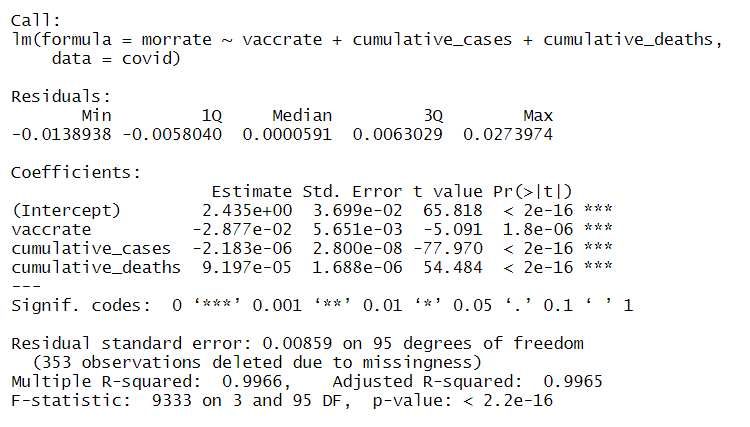

The R model output shows that vaccination rate is statistically significant at a significance level of 0.05  with a p-value of 1.86 *10^-6. The model has a low residul standard error value and a high Multiple R-squared value indicating that the model is a good fit.

**Recovery rate model**

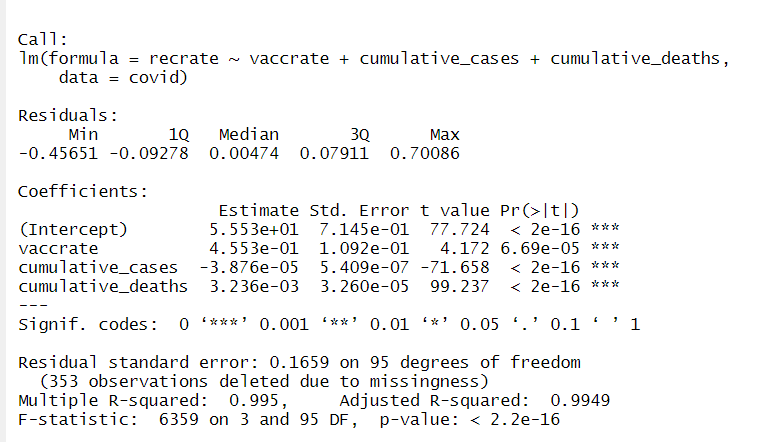

The R model output shows that vaccination rate is statistically significant at a significance level of 0.05  with a p-value of 6.69*10^-5. The model has a low residual standard error value and a high Multiple R-squared value indicating that the model is a good fit.

# Results

> *Mortality*

> We found a significant relationship between COVID-19 mortality rate and Vaccination rate (p < 0.005, R2 = 0.99), for every 1% increase in vaccination rate, there is a correlated 2.877 *10^-2 % decrease in the COVID-19 mortality rate. 
These findings correspond with our expectations. We expected to see a decrease in COVID-19 mortality as the vaccination rates increase, as individuals should not be getting as ill with the virus and less individuals are infected.

> *Recovery rate*

> We found a significant relationship between COVID-19 recovery rate and vaccination rate (p < 0.005, R2 = 0.99), for every 1% increase in vaccination rate, there is a correlated 4.55 *10^-1 % increase in the COVID-19 mortality rate. These findings are also in alignment with what we expected. A s vaccination rates increase, we expect to see an increase in COVID-19 recovery rates.

# Discussion and Limitations
The linear regression models for mortality rate and recovery rate performed well, however, one thing to consider is that the impact that we saw in our model of vaccination on mortality rate and recovery rate although highly significant is quite low. This is probably because we don't yet have enough vaccination data as vaccines in Canada started being administred in December 2020.

Additionally, the linear regression models although they have a high R2 they do not meet all the assumption requirements for linear regression. The models show some level of non-linearity in the data and some heteroscedascicity is also observed in the dataset.
To try and normalize the data and improve model fit, the data was scaled in R and missing data was eliminated. 

A log transformed version of both models was also tested to see if this improved assumption problems, however the log transformed models perfromed worst that the simple linear models.

Additionally, many other factors influence COVID-19 mortality and recovery rate, and the models we built just included a few variables. In order, to get a better understanding, more sophisticated models with more variables would need to be built.


# References

* Rae, M., 2020. The Challenge of Measuring the Economic Impact of Coronavirus. London: SAGE Publications, Inc. Available at: <http://www.doi.org.ezproxy.lib.ucalgary.ca/10.4135/9781529741377> [Accessed 19 Apr 2021].

* Seyed, M. et al, 2020. The impact of vaccination on COVID-19 outbreaks in the United States.Clinical Infectious Diseases. Available at:<medRxiv 2020.11.27.20240051; doi: https://doi.org/10.1101/2020.11.27.20240051> [Accessed 19 Apr 2021].

* Singh, J., 2020. COVID-19 and Its Impact on Society. Electronic Research Journal of Social Sciences and Humanities, Vol 2: Issue I, 2020.Available at: <https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3567837> [Accessed 19 Apr 2021].
